# Anomaly ECMWF

C3S hindcast (1993 - 2016) and C3S forecast (2018 - 2022), downscaled at 1km with WorldClim

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import dask.array as da
import dask
from dask.diagnostics import ProgressBar
import glob
import os
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
from weatherforce.standardization import standardize_coordinates
from cartopy.io import shapereader
from pprint import pprint
from cartopy.feature import ShapelyFeature
from weatherforce.spacetime.space import bbox_from_data
from weatherforce.dataviz.maps.static import make_map_with_features

### Functions

In [2]:
def get_c3s_run_time(month:int = 1, downscaled:bool = True, hindcast:bool = False, forecast:bool = False) -> xr.Dataset:
    
    """
    Retrieve C3S ECMWF SEAS5 total precipitation data for a specific month.

    Parameters:
        month (int): Month value (1-12) for which to retrieve the data. Defaults to 1 (January).
        downscaled (bool): If True, retrieve the downscaled data. If False, retrieve the original forecast data.
                           Defaults to True.
        hindcast (bool): If True, filter the data to include only hindcast data within the range of 1993-01-01 to
                         2016-12-31. Applicable only when downscaled is True. Defaults to False.
        forecast (bool): If True, filter the data to include only forecast data starting from 2017-01-01.
                         Applicable only when downscaled is True. Defaults to False.

    Returns:
        xr.Dataset: Dataset containing the C3S ECMWF SEAS5 total precipitation data for the specified month.

    """
    
    start_date = np.datetime64(dt.datetime(1993, 1, 1))
    end_date = np.datetime64(dt.datetime(2016, 12, 31))
    forecast_start = np.datetime64(dt.datetime(2017, 1, 1))
    
    if downscaled:
        ds = xr.open_mfdataset(f'/home/jovyan/data/share/Martin/ESA/WP11/c3s_seasonal/downscaled/tp/peru_north/1km/method_002/*/{month:02d}/*.nc', preprocess=preprocess)
        if hindcast:
            ds = ds.sel(run_time=(ds.run_time >= start_date) & (ds.run_time <= end_date))
        if forecast:
            ds = ds.sel(run_time=(ds.run_time >= forecast_start))
    else:
        ds = xr.open_mfdataset( f'/home/jovyan/data/forecast/c3s_seasonal/peru_north/*/*/{month:02d}/*.nc', preprocess=preprocess)

    with ProgressBar():
        ds = ds.load()
        
    return ds


In [3]:
def preprocess(ds,downscaled:bool = True) -> xr.Dataset:
    
    """
    Preprocess the C3S ECMWF SEAS5 total precipitation dataset.

    Parameters:
        ds (xr.Dataset): Dataset containing the C3S ECMWF SEAS5 total precipitation data.
        downscaled (bool): If True, the dataset represents downscaled data. If False, it represents original forecast data.
                           Defaults to True.

    Returns:
        xr.Dataset: Preprocessed dataset.

    """
    
    if 'tprate' in list(ds.keys()):

        nb_days = ds.time.dt.days_in_month
        # m/s to mm/month
        conversion_factor = 1e3 * 3600 * 24

        # Apply conversion
        converted_ds = ds * conversion_factor * nb_days
        converted_ds.attrs["units"] = "mm"
        # rename latitude and longitude to lat /lon (WF format)
        converted_ds = standardize_coordinates(converted_ds)

        # rename variable to tp
        ds = converted_ds.rename_vars(name_dict={'tprate': 'tp'})        
    
    with dask.config.set(**{'array.slicing.split_large_chunks': True}):
        run_time = ds.indexes["time"][0]
        ds = ds.assign_coords({"run_time": run_time})
        ds = ds.expand_dims("run_time")
        ds = ds.assign_coords({"time": [i for i in range(1, 7)]})
        #ds = ds.assign_coords({"offset": ("time", [f"{i}MS" for i in range(6)])})
        ds = ds.rename({"time": "lead_time"})
        # put negative values to zeros
        ds['tp'] = xr.where(ds['tp'] < 0, 0, ds['tp'])

    return ds

In [4]:
def generate_anomalies(month: int = 1, year: int = 2018, type_an:str = 'absolute') -> xr.DataArray:
    """
    Generate total precipitation anomalies for a specific month and year.

    Parameters:
        month (int): Month for which to generate the anomalies (1-12).
        year (int): Year for which to generate the anomalies.
        type_an (str): Type of anomalies: 'absolute' or 'relative'.

    Returns:
        xr.DataArray: An array containing the total precipitation anomalies.

    """
    # Get the C3S ECMWF SEAS5 forecast dataset for the specified month
    ds_forecast = get_c3s_run_time(month, downscaled=True, forecast=True)

    # Select the forecast data for the specified year and month
    runtime = np.datetime64(dt.datetime(year, month, 1))
    ds_forecast_t = ds_forecast.sel(run_time=(ds_forecast.run_time == runtime))

    # Open the reference dataset for the corresponding month
    ref = xr.open_dataset(f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/c3s_ref/tp_c3s_hindcast_month_{month}.nc')

    if (type_an=='absolute'):
        # Calculate the absolute anomalies by subtracting the forecast data from the reference data
        anomalies = ds_forecast_t.tp - ref.tp
        # Set the attributes for the anomalies dataset
        anomalies.attrs['units'] = 'mm'
        anomalies.attrs['long_name'] = 'Total precipitation absolute anomaly'
    elif (type_an=='relative'):
        # Calculate the relative anomalies
        anomalies = ((ds_forecast_t.tp - ref.tp)/ref.tp)*100
        anomalies.attrs['units'] = '%'
        anomalies.attrs['long_name'] = 'Total precipitation relative anomaly'
    else:
        print("Please choose the type of anomaly: 'absolute' or 'relative'.")
        anomalies = None

    return anomalies


In [22]:
def plot_anomalies_leads(anomalies: xr.DataArray, lead_deb: int = 1, lead_end: int = 2) -> None:
    """
    Plot total precipitation anomalies for a range of lead times.

    Parameters:
        anomalies (xr.DataArray): An array containing the total precipitation anomalies.
        lead_deb (int): Starting lead time (default: 1).
        lead_end (int): Ending lead time (inclusive) (default: 2).

    Returns:
        None

    """
    # Set the starting and ending lead times
    lead_time_start = lead_deb
    lead_time_end = lead_end

    # Create plots based on the number of lead times
    new_date_format = anomalies['run_time'].dt.strftime('%b, %Y')
    cmap = plt.cm.get_cmap('RdBu')  # Set the colormap to go from red to blue
    
    # Region boundaries
    kw = dict(resolution='10m', category='cultural', name='admin_1_states_provinces')
    states_shp = shapereader.natural_earth(**kw)
    reader = shapereader.Reader(states_shp)
    current_country = [country for country in reader.records() if country.attributes["admin"] == "Peru"]

    # Loop through the lead times and plot the anomalies
    for lead_time in range(lead_time_start-1, lead_time_end):
        fig, ax, cbar_ax = make_map_with_features(bbox_from_data(anomalies))
        if anomalies.attrs.get('units') == '%':
            vmin, vmax = -100, 100 # Set the color bar range white at 100%
            type_an = 'relative'
        else:
            vmin, vmax = -120, 120
            type_an = 'absolute'
            
        anomalies.isel(lead_time=lead_time, run_time=0).plot(ax=ax, cbar_ax=cbar_ax, cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_title(f'Lead Time: +{lead_time+1} month')
            
        for region in current_country:
            shape_feature = ShapelyFeature([region.geometry], ccrs.PlateCarree(), edgecolor='black', lw=1, facecolor="none")
            ax.add_feature(shape_feature)
            
        lata, lona = [-7.063781], [-79.552680] # ACP
        latb, lonb = [-7.230], [-79.172] # Gallito Ciego dam
        ax.plot(lona, lata, '*', color ='r', label = 'ACP')
        ax.plot(lonb, latb, '*', color = 'g', label = 'Dam')

        # Set the overall title
        fig.suptitle('C3S ECMWF SEAS5 total precipitation anomaly'
                     + os.linesep
                     + f'Start data: {str(new_date_format[0].data)}', fontsize=18)
        plt.tight_layout()

        # Display the plot
        plt.show()
        fig.savefig(f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/anomalies_ecmwf/anomalies_{str(new_date_format[0].data)}_{lead_time}_{type_an}.png')
        plt.close()

In [21]:
def plot_anomalies_leads_zoom(anomalies: xr.DataArray, lead_deb: int = 1, lead_end: int = 2, zoom:int=1) -> None:
    """
    Plot total precipitation anomalies for a range of lead times.

    Parameters:
        anomalies (xr.DataArray): An array containing the total precipitation anomalies.
        lead_deb (int): Starting lead time (default: 1).
        lead_end (int): Ending lead time (inclusive) (default: 2).

    Returns:
        None

    """
    # Set the starting and ending lead times
    lead_time_start = lead_deb
    lead_time_end = lead_end

    # Create plots based on the number of lead times
    new_date_format = anomalies['run_time'].dt.strftime('%b, %Y')
    cmap = plt.cm.get_cmap('RdBu')  # Set the colormap to go from red to blue
    
    # Region boundaries
    kw = dict(resolution='10m', category='cultural', name='admin_1_states_provinces')
    states_shp = shapereader.natural_earth(**kw)
    reader = shapereader.Reader(states_shp)
    current_country = [country for country in reader.records() if country.attributes["admin"] == "Peru"]

    # Loop through the lead times and plot the anomalies
    for lead_time in range(lead_time_start-1, lead_time_end):
        fig, ax, cbar_ax = make_map_with_features(bbox_from_data(anomalies))
        if (zoom==1):
            ax.set_extent([-79.8, -78.9, -7.5, -6.8])
        elif (zoom==2):
            ax.set_extent([-79.8, -75, -8.3, -5.3])
        if anomalies.attrs.get('units') == '%':
            vmin, vmax = -100, 100 # Set the color bar range white at 100%
            type_an = 'relative'
        else:
            vmin, vmax = -120, 120
            type_an = 'absolute'
            
        anomalies.isel(lead_time=lead_time, run_time=0).plot(ax=ax, cbar_ax=cbar_ax, cmap=cmap, vmin=vmin, vmax=vmax)
        ax.set_title(f'Lead Time: +{lead_time+1} month')
            
        for region in current_country:
            shape_feature = ShapelyFeature([region.geometry], ccrs.PlateCarree(), edgecolor='black', lw=1, facecolor="none")
            ax.add_feature(shape_feature)
            
        lata, lona = [-7.063781], [-79.552680] # ACP
        latb, lonb = [-7.230], [-79.172] # Gallito Ciego dam
        ax.plot(lona, lata, '*', color ='r', label = 'ACP')
        ax.plot(lonb, latb, '*', color = 'g', label = 'Dam')

        # Set the overall title
        fig.suptitle('C3S ECMWF SEAS5 total precipitation anomaly'
                     + os.linesep
                     + f'Start data: {str(new_date_format[0].data)}', fontsize=18)
        plt.tight_layout()

        # Display the plot
        plt.show()
        fig.savefig(f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/anomalies_ecmwf/anomalies_{str(new_date_format[0].data)}_{lead_time}_{type_an}_zoom_{zoom}.png')
        plt.close()

In [20]:
def plot_anomalies_lead(anomalies: xr.DataArray, lead_time: int = 1) -> None:
    """
    Plot total precipitation anomalies for a specific lead time.

    Parameters:
        anomalies (xr.DataArray): An array containing the total precipitation anomalies.
        lead_time (int): Lead time to plot (default: 1).

    Returns:
        None

    """
    fig, ax, cbar_ax = make_map_with_features(bbox_from_data(anomalies))
    new_date_format = anomalies['run_time'].dt.strftime('%b, %Y')
    cmap = plt.cm.get_cmap('RdBu') # Set the colormap from red to blue
    
    # Region boundaries
    kw = dict(resolution='10m', category='cultural', name='admin_1_states_provinces')
    states_shp = shapereader.natural_earth(**kw)
    reader = shapereader.Reader(states_shp)
    current_country = [country for country in reader.records() if country.attributes["admin"] == "Peru"]

    for region in current_country:
        shape_feature = ShapelyFeature([region.geometry], ccrs.PlateCarree(), edgecolor='black', lw=1, facecolor="none")
        ax.add_feature(shape_feature)
    
    if anomalies.attrs.get('units') == '%':
        vmin, vmax = -100, 100 # Set the color bar range white at 100%
    else:
        vmin, vmax = -120, 120
    
    anomalies.isel(lead_time=lead_time-1, run_time=0).plot(ax=ax, cbar_ax=cbar_ax, cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_title(f'Lead Time: +{lead_time} month')
    
    lata, lona = [-7.063781], [-79.552680] # ACP
    latb, lonb = [-7.230], [-79.172] # Gallito Ciego dam
    ax.plot(lona, lata, '*', color ='r', label = 'ACP')
    ax.plot(lonb, latb, '*', color = 'g', label = 'Dam')
    
    fig.suptitle('C3S ECMWF SEAS5 total precipitation anomaly'
              + os.linesep
              + f'Start data: {str(new_date_format[0].data)}', fontsize=12)
    plt.tight_layout()
    plt.show()
    plt.close()


In [8]:
def plot_rel_anom_dam(year: int = 2021, month: int = 6):
    """
    Plots the relative precipitation anomaly for a specific month and year at the dam location.

    Args:
        year (int, optional): The year for which to plot the anomaly. Defaults to 2021.
        month (int, optional): The month for which to plot the anomaly. Defaults to 6.

    Returns:
        None
    """
    # Generate relative anomalies for the specified month and year
    anom = generate_anomalies(month=month, year=year, type_an='relative')
    
    # Location of the dam
    lat_dam, lon_dam = -7.230, -79.172
    
    # Select anomalies at the dam's location
    dam_anom = anom.sel(lat=lat_dam, lon=lon_dam, method='nearest')
    
    # Create a new figure and subplot
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Plot the relative anomalies with circular markers
    plt.plot(range(1, 7), dam_anom[0], marker='o')
    
    # Set labels and title
    plt.ylabel('Relative anomaly (%)')
    plt.xlabel('Step (month)')
    plt.title(f'Precipitation anomaly C3S model for {year}-{month:02d}')
    
    # Display and save the plot
    plt.show()
    fig.savefig(f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/anomalies_ecmwf/tp_dam_rel_anomalies_{month}_{year}.png')
    plt.close()

In [9]:
def plot_abs_anom_dam(year: int = 2021, month: int = 6):
    """
    Plots the absolute precipitation anomaly for a specific month and year at the dam location.

    Args:
        year (int, optional): The year for which to plot the anomaly. Defaults to 2021.
        month (int, optional): The month for which to plot the anomaly. Defaults to 6.

    Returns:
        None
    """
    # Generate relative anomalies for the specified month and year
    anom = generate_anomalies(month=month, year=year, type_an='absolute')
    
    # Location of the dam
    lat_dam, lon_dam = -7.230, -79.172
    
    # Select anomalies at the dam's location
    dam_anom = anom.sel(lat=lat_dam, lon=lon_dam, method='nearest')
    
    # Create a new figure and subplot
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Plot the relative anomalies with circular markers
    plt.plot(range(1, 7), dam_anom[0], marker='o')
    
    # Set labels and title
    plt.ylabel('Absolute anomaly (mm)')
    plt.xlabel('Step (month)')
    plt.title(f'Precipitation anomaly C3S model for {year}-{month:02d}')
    
    # Display and save the plot
    plt.show()
    fig.savefig(f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/anomalies_ecmwf/tp_dam_abs_anomalies_{month}_{year}.png')
    plt.close()


### Reference - C3S hindcast

In [8]:
for month in range (1,13):
    ds_hindcast = get_c3s_run_time(month, downscaled=True, hindcast = True)
    ds_hindcast_mean = ds_hindcast.mean(dim='run_time')
    
    ds_hindcast_mean.to_netcdf(f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/c3s_ref/tp_c3s_hindcast_month_{month}.nc')

[########################################] | 100% Completed | 8.19 sms
[########################################] | 100% Completed | 11.43 s
[########################################] | 100% Completed | 10.41 s
[########################################] | 100% Completed | 11.32 s
[########################################] | 100% Completed | 11.42 s
[########################################] | 100% Completed | 8.90 ss
[########################################] | 100% Completed | 10.21 s
[########################################] | 100% Completed | 9.71 ss
[########################################] | 100% Completed | 10.72 s
[########################################] | 100% Completed | 10.11 s
[########################################] | 100% Completed | 10.11 s
[########################################] | 100% Completed | 10.41 s


### Anomalies C3S

Dam location

[########################################] | 100% Completed | 808.28 ms


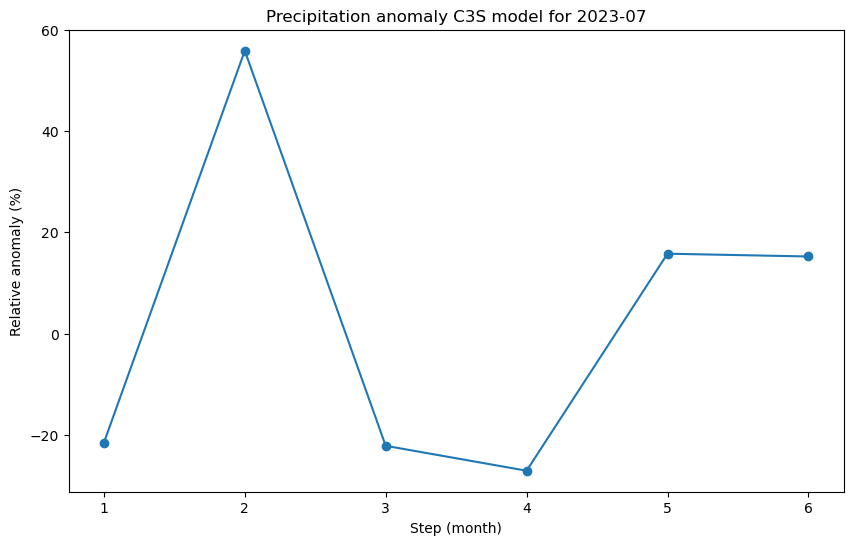

In [12]:
plot_rel_anom_dam(2023,7)

[########################################] | 100% Completed | 2.42 sms


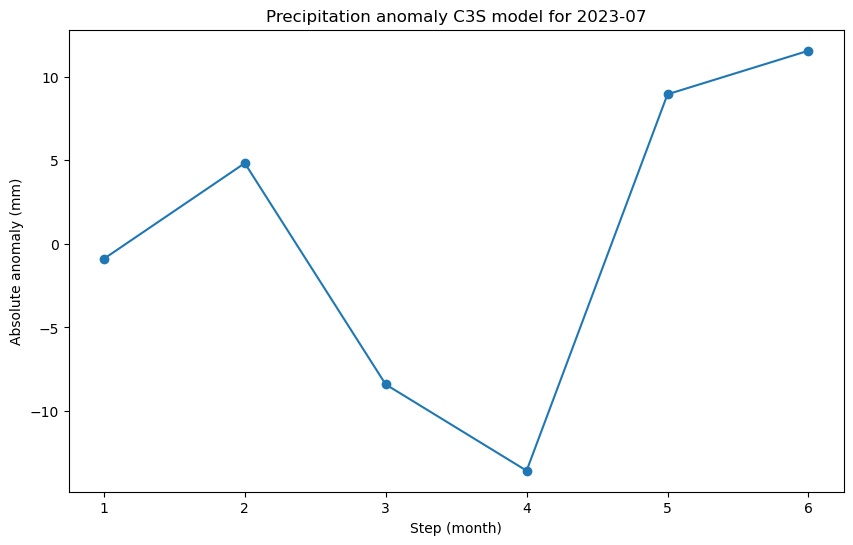

In [16]:
plot_abs_anom_dam(2023,7)

In [ ]:
year = 2021
for month in range(6,13):
    plot_rel_anom_dam(year,month)

year = 2022
for month in range(1,13):
    plot_rel_anom_dam(year,month)


Full region

In [10]:
anomalies_abs = generate_anomalies(month=1, year=2019, type_an='absolute')
anomalies_rel = generate_anomalies(month=1, year=2019, type_an='relative')

[########################################] | 100% Completed | 709.33 ms
[########################################] | 100% Completed | 710.38 ms


/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


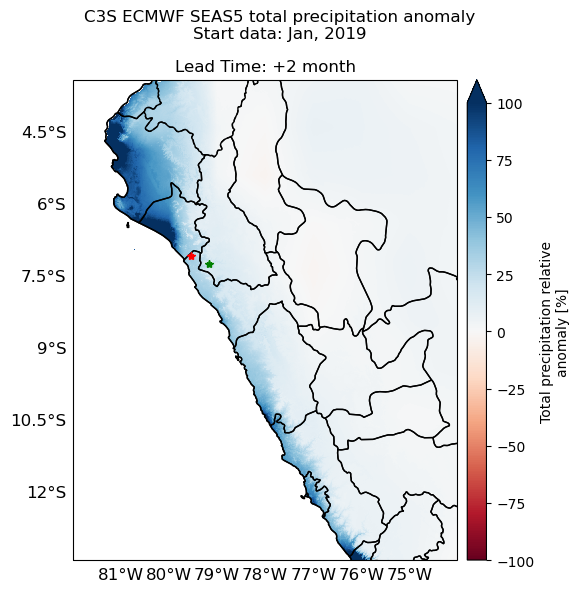

In [11]:
plot_anomalies_lead(anomalies_rel,2)

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


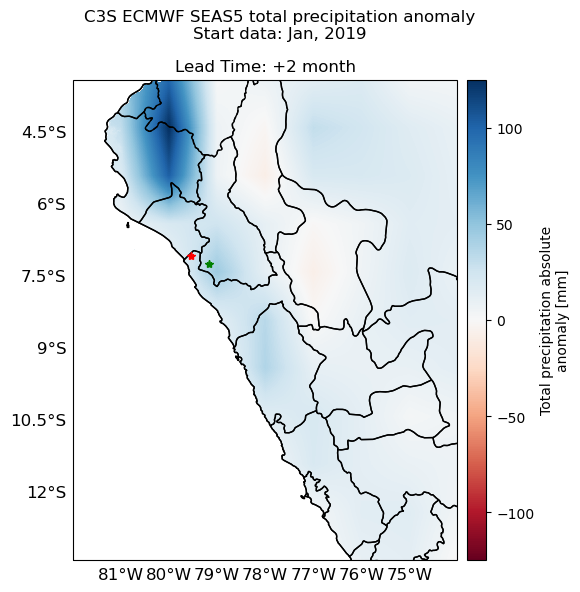

In [11]:
plot_anomalies_lead(anomalies_abs,2)

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


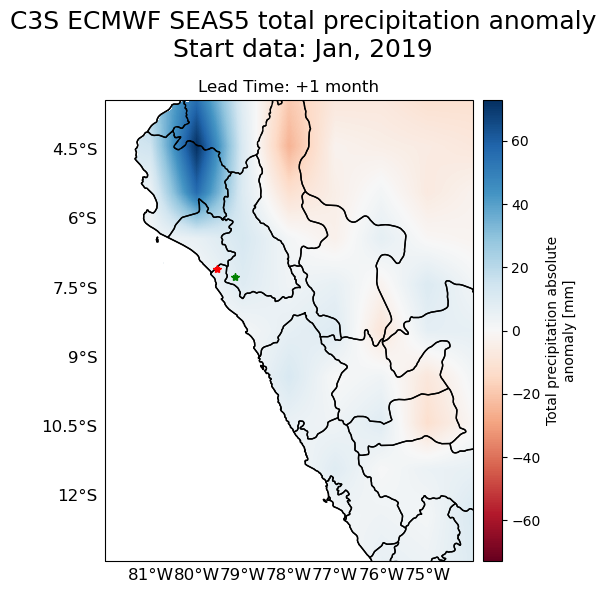

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


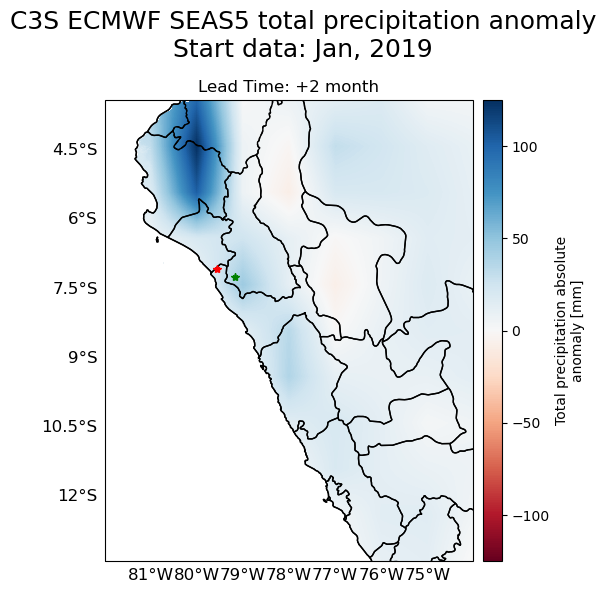

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


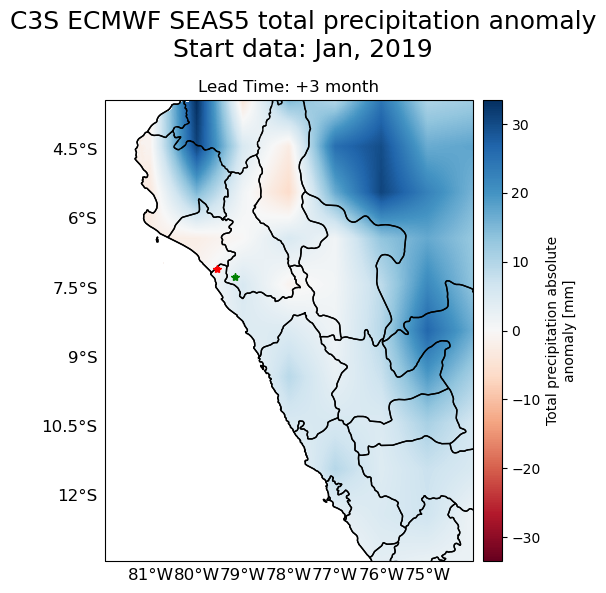

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


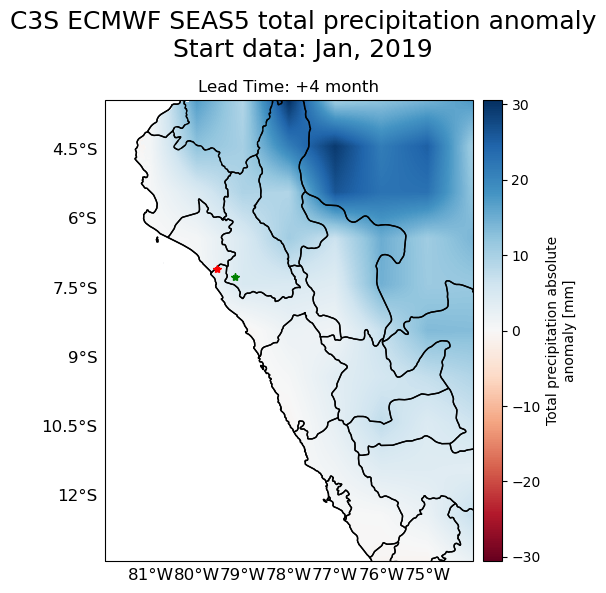

/srv/conda/envs/notebook/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:406: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


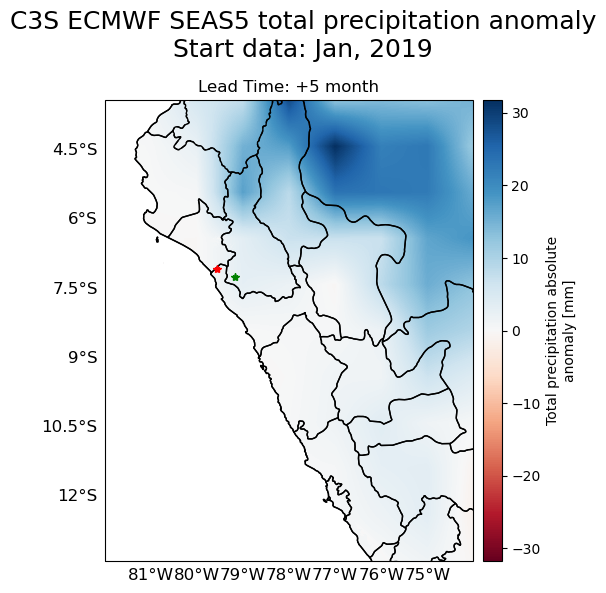

In [12]:
plot_anomalies_leads(anomalies_abs,1,5)

### Plot of total precipitation anomalies for each seasonal forecast month

In [13]:
weights = np.cos(np.deg2rad(anomalies_abs))
weights
weights = weights.fillna(0)
anom_region = anomalies_abs.weighted(weights).mean(['lat','lon'])

anom_region_df = anom_region.to_dataframe(name='anomaly')
#anom_region_df

In [14]:
anom_region_df_yr = anom_region_df.reset_index().drop('run_time',axis=1).set_index(['lead_time']).unstack()
anom_region_df_yr = anom_region_df.reset_index()
anom_region_df_yr['lead_time'] = ['1','2','3','4','5','6']
#anom_region_df_yr['lead_time'] = str(anom_region_df_yr['lead_time'])
anom_region_df_yr

,run_time,lead_time,anomaly
0,2019-01-01,1,21.898886
1,2019-01-01,2,3.210727
2,2019-01-01,3,13.480710
3,2019-01-01,4,9.441631
4,2019-01-01,5,8.948388
5,2019-01-01,6,7.685894


In [15]:
ref = xr.open_dataset(f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/c3s_ref/tp_c3s_hindcast_month_{month}.nc')
tprate_hindcast = ref.tp

tprate_hindcast_region = tprate_hindcast.weighted(weights).mean(['lat','lon'])
anom_hindcast = tprate_hindcast_region - tprate_hindcast_region.mean(['lead_time'])

In [16]:
P0 = anom_hindcast.min(['lead_time'])
P33 = anom_hindcast.quantile(1/3.,['lead_time'])
P66 = anom_hindcast.quantile(2/3.,['lead_time'])
P100 = anom_hindcast.max(['lead_time'])

Text(0.5, 0, '\nValid date')

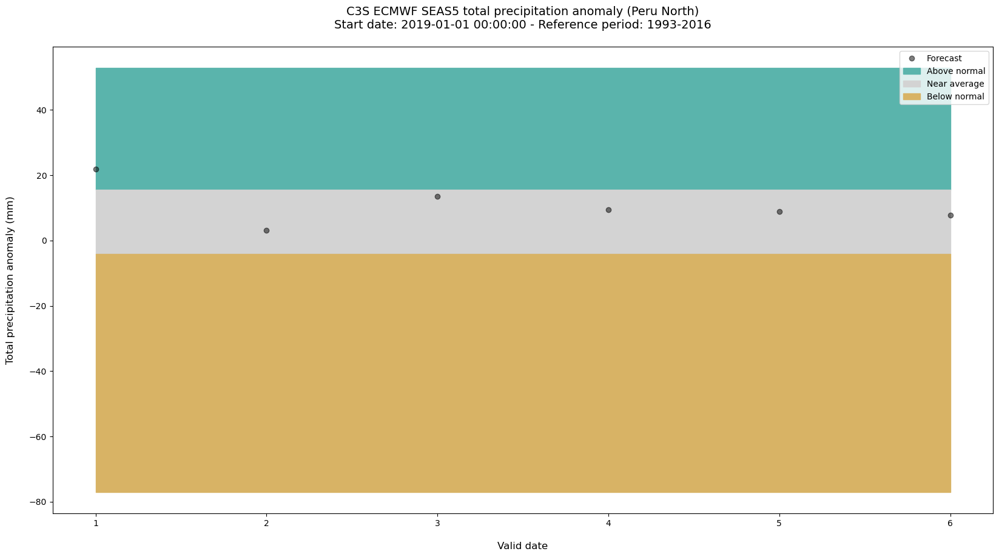

In [17]:
from collections import OrderedDict

# Initiate the figure
fig=plt.figure(figsize=(20, 10))
ax=fig.gca()

# Plot the seasonal forecast anomalies + climatology boundaries as filled areas
ax.plot(anom_region_df_yr.lead_time, anom_region_df_yr.anomaly, marker='o', linestyle='', color='black', alpha=0.5, label='Forecast')
ax.fill_between(anom_region_df_yr.index,P66,P100,color='#5ab4ac',label='Above normal')
ax.fill_between(anom_region_df_yr.index,P33,P66,color='lightgray',label='Near average')
ax.fill_between(anom_region_df_yr.index,P0,P33,color='#d8b365',label='Below normal')

# Customize plot settings
plt.title('C3S ECMWF SEAS5 total precipitation anomaly (Peru North)' 
          + os.linesep + 
          f'Start date: {anom_region_df_yr.run_time[0]} - Reference period: 1993-2016' 
          + os.linesep, fontsize=14)

handles, labels = plt.gca().get_legend_handles_labels()
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())

ax.set_ylabel('Total precipitation anomaly (mm)' + os.linesep, fontsize=12)
ax.set_xlabel(os.linesep + 'Valid date', fontsize=12)


### All anomalies

In [ ]:
year = 2023
for month in range (1,2):
        anomalies_abs = generate_anomalies(month=month, year=year, type_an='absolute')
        anomalies_rel = generate_anomalies(month=month, year=year, type_an='relative')
        
        plot_anomalies_leads(anomalies_abs,1,6)
        plot_anomalies_leads_zoom(anomalies_abs,1,6,2)
        plot_anomalies_leads_zoom(anomalies_abs,1,6,1)
        plot_anomalies_leads(anomalies_rel,1,6)
        plot_anomalies_leads_zoom(anomalies_rel,1,6,2)
        plot_anomalies_leads_zoom(anomalies_rel,1,6,1)
        

In [ ]:
for year in range (2018,2023):
    for month in range (1,13):
        anomalies_abs = generate_anomalies(month=month, year=year, type_an='absolute')
        anomalies_rel = generate_anomalies(month=month, year=year, type_an='relative')
        
        plot_anomalies_leads(anomalies_abs,1,5)
        plot_anomalies_leads_zoom(anomalies_abs,1,5,2)
        plot_anomalies_leads(anomalies_rel,1,5)
        plot_anomalies_leads_zoom(anomalies_rel,1,5,2)
        

### Grid

In [41]:
def plot_grid_images(years, lead_time, type_an, zoom:bool=False):
    # Define the grid size based on the number of years and months
    grid_shape = (len(years), 12)
    months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

    # Create a new figure and subplot grid
    fig, axs = plt.subplots(*grid_shape, figsize=(50, 20))

    # Iterate over the years and months to plot the images
    for year_idx, year in enumerate(years):
        for month_idx, month in enumerate(months):
            # Get the file path of the PNG image
            if not (zoom):
                file_path = f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/anomalies_ecmwf/anomalies_{month}, {year}_{lead_time}_{type_an}.png'
            else:
                file_path = f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/anomalies_ecmwf/anomalies_{month}, {year}_{lead_time}_{type_an}_zoom.png'

            
            # Read the image data using matplotlib's imread function
            img_data = plt.imread(file_path)

            # Display the image on the corresponding subplot
            axs[year_idx, month_idx].imshow(img_data)

            # Remove ticks and labels from the subplots
            axs[year_idx, month_idx].axis('off')

    # Set the overall title of the plot
    fig.suptitle(f'Total Precipitation {type_an} anomaly for lead time {lead_time}', fontsize=18)

    # Adjust the spacing between subplots and remove margins at the sides
    plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, bottom=0, top=1)

    # Save the plot without extra whitespace
    if not (zoom):
        fig.savefig(f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/anomalies_ecmwf/1_anomalies_lead_{lead_time}_{type_an}.png', bbox_inches='tight')
    else:
        fig.savefig(f'/home/jovyan/data/share/heloise/ESA-WP11/Anomaly/anomalies_ecmwf/1_anomalies_lead_{lead_time}_{type_an}_zoom_2.png', bbox_inches='tight')


    # Show the plot
    plt.show()


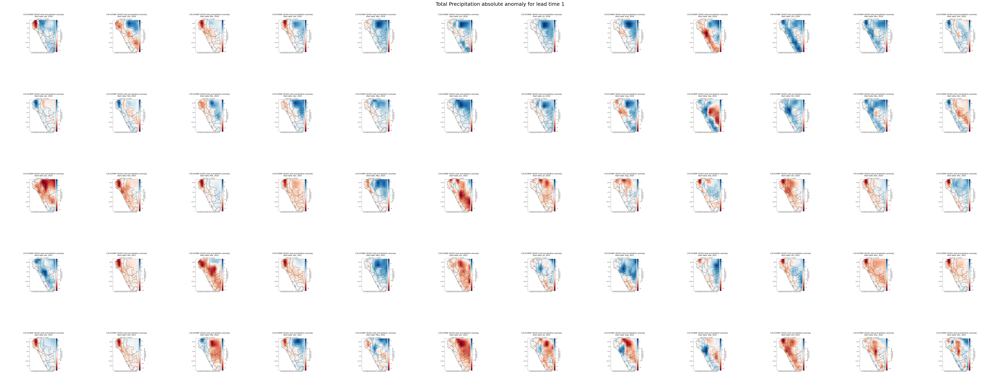

In [42]:
plot_grid_images(years=[2018,2019,2020,2021,2022], lead_time=1, type_an='absolute')

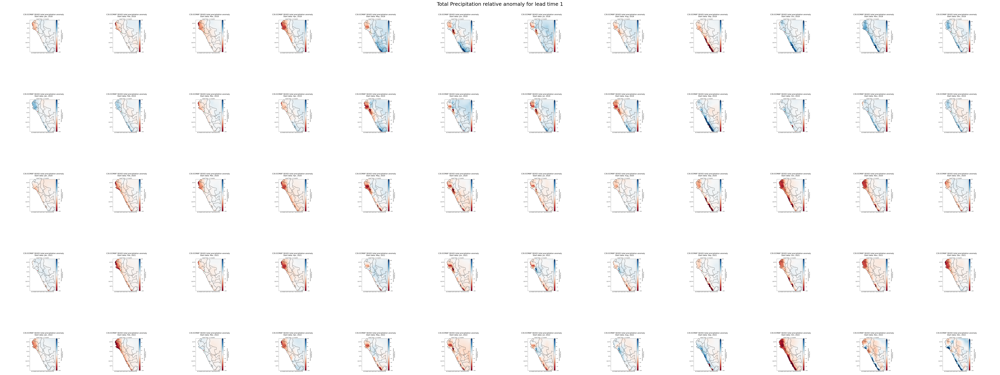

In [43]:
plot_grid_images(years=[2018,2019,2020,2021,2022], lead_time=1, type_an='relative')

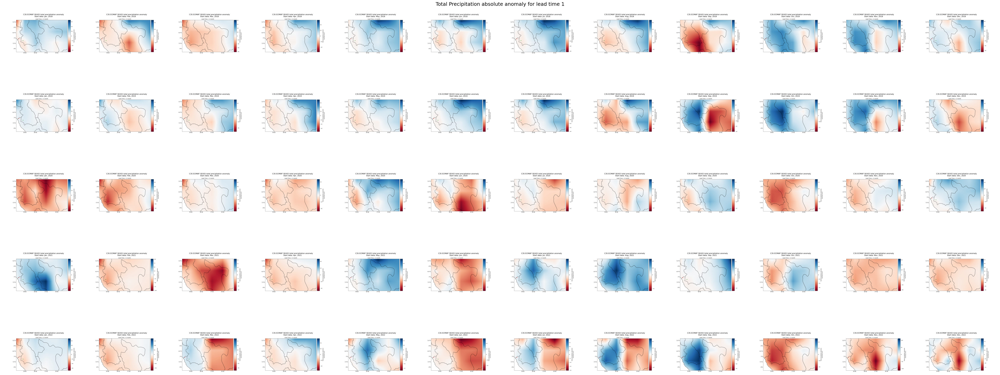

In [44]:
plot_grid_images(years=[2018,2019,2020,2021,2022], lead_time=1, type_an='absolute', zoom=True)

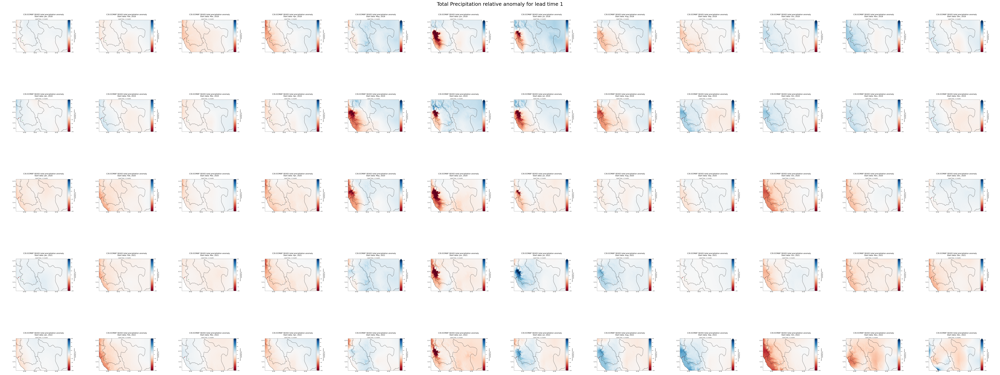

In [45]:
plot_grid_images(years=[2018,2019,2020,2021,2022], lead_time=1, type_an='relative', zoom=True)